<a href="https://colab.research.google.com/github/sergeichukd/kaggle-cleaned_vs_dirty_v2_public/blob/main/cleaned_vs_dirty_v2_public.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Constants

In [ ]:
import torch
from torchvision import models, transforms

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print('Use device:', DEVICE)

LEARNING_RATE = 1.0e-2
NUM_EPOCHS = 100
TRAINING_MODE = 'best_acc'
THRESHOLD = 0.5

HISTORY_TEMPLATE = {
    'train_loss': [], 
    'train_acc': [], 
    'train_precision': [], 
    'train_recall': [], 
    'train_f1': [], 
    'val_loss': [], 
    'val_acc': [],
    'val_precision': [], 
    'val_recall': [],
    'val_f1': []
}

Use device: cuda:0


#Tensorboard

In [ ]:
!rm -fr /content/runs

In [ ]:
from torch.utils.tensorboard import SummaryWriter

%load_ext tensorboard
%tensorboard --logdir runs

#Device

In [ ]:
!nvidia-smi
# !cat /proc/cpuinfo

# Init environment

In [ ]:
%pip install opencv-python -U
%pip install albumentations -U
%pip install grad-cam

# Init working tree

In [ ]:
import numpy as np
import pandas as pd
import os
import zipfile
import shutil 
from tqdm import tqdm


# %pip install --user kaggle  # Comment it if use google colab

USE_GOOGLE_DRIVE = False
if USE_GOOGLE_DRIVE:
    from google.colab import drive
    drive.mount('/content/drive')
    WEIGHTS_ROOT = '/content/drive/MyDrive/colab_data/cleaned_vs_dirty_v2'
else:
    import os
    WEIGHTS_ROOT = '/content/weights'
    os.makedirs(WEIGHTS_ROOT, exist_ok=True)

ENSEMBLE_ROOT = os.path.join(WEIGHTS_ROOT, 'ensemble')
os.makedirs(ENSEMBLE_ROOT, exist_ok=True)

%env KAGGLE_USERNAME=<your kaggle username>
%env KAGGLE_KEY=<your kaggle key>

!kaggle competitions download -c platesv2
print(os.listdir("."))

with zipfile.ZipFile('platesv2.zip', 'r') as zip_obj:
   # Extract all the contents of zip file in current directory
   zip_obj.extractall('')
    
print('After zip extraction:')
print(os.listdir("."))

%rm platesv2.zip

with zipfile.ZipFile('plates.zip', 'r') as zip_obj:
   # Extract all the contents of zip file in current directory
   zip_obj.extractall('')

%rm platesv2.zip

print('After zip extraction:')
print(os.listdir("."))

DATA_ROOT = '/content/plates'
print('Data root comntent:', os.listdir(DATA_ROOT))
TRAIN_DIR = '/content/train'
VAL_DIR = '/content/val'
CLASS_NAMES = ['cleaned', 'dirty']

for dir_name in [TRAIN_DIR, VAL_DIR]:
    for class_name in CLASS_NAMES:
        os.makedirs(os.path.join(dir_name, class_name), exist_ok=True)

for class_name in CLASS_NAMES:
    source_dir = os.path.join(DATA_ROOT, 'train', class_name)
    for i, file_name in enumerate(tqdm(os.listdir(source_dir))):
        if i % 6 != 0:
            dest_dir = os.path.join(TRAIN_DIR, class_name) 
        else:
            dest_dir = os.path.join(VAL_DIR, class_name)
        shutil.copy(os.path.join(source_dir, file_name), os.path.join(dest_dir, file_name))

env: KAGGLE_USERNAME=sergeichukd
env: KAGGLE_KEY=6526f61f4a9b26e6ad8166d7d3d66710
 87% 41.0M/47.0M [00:01<00:00, 32.7MB/s]
100% 47.0M/47.0M [00:01<00:00, 33.3MB/s]
['.config', 'platesv2.zip', 'weights', 'sample_data']
After zip extraction:
['.config', 'platesv2.zip', 'weights', 'sample_submission.csv', 'plates.zip', 'sample_data']
rm: cannot remove 'platesv2.zip': No such file or directory
After zip extraction:
['.config', 'plates', 'weights', '__MACOSX', 'sample_submission.csv', 'plates.zip', 'sample_data']
Data root comntent: ['train', '.DS_Store', 'test']


100%|██████████| 21/21 [00:00<00:00, 4742.39it/s]


# Plot Funcs

In [ ]:
from typing import Tuple, Dict, Union, List
from matplotlib import pyplot as plt
import matplotlib
import torch
from torch import Tensor, nn
from torchvision.utils import make_grid
import math

def prepare_to_plot(input_tensor: Tensor) -> np.ndarray:
    assert len(input_tensor.shape) in [3, 4]
    if len(input_tensor.shape) == 4:
        image = input_tensor.permute(0, 2, 3, 1).numpy()
    elif len(input_tensor.shape) == 3: 
        image = input_tensor.permute(1, 2, 0).numpy()
    
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    image = image.clip(0, 1)
    return image

def show_input(input_tensor: Tensor, title: str = '') -> None:
    image = prepare_to_plot(input_tensor)
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()


def plot_history(history: dict, start_epoch: int = 0, show: bool = True) -> matplotlib.figure.Figure:
    fig, (ax_loss, ax_acc, ax_precision, ax_recall, ax_f1) = plt.subplots(5, 1, figsize=(10, 25))
    ax_loss.plot(history['train_loss'][start_epoch:], label='train')
    ax_loss.plot(history['val_loss'][start_epoch:], label='val')
    ax_loss.set_title('Loss')
    ax_loss.grid()
    ax_loss.legend()

    ax_acc.plot(history['train_acc'][start_epoch:], label='train')
    ax_acc.plot(history['val_acc'][start_epoch:], label='val')
    ax_acc.set_title('Accuracy')
    ax_acc.grid()
    ax_acc.legend()

    ax_precision.plot(history['train_precision'][start_epoch:], label='train')
    ax_precision.plot(history['val_precision'][start_epoch:], label='val')
    ax_precision.set_title('Precision')
    ax_precision.grid()
    ax_precision.legend()

    ax_recall.plot(history['train_recall'][start_epoch:], label='train')
    ax_recall.plot(history['val_recall'][start_epoch:], label='val')
    ax_recall.set_title('Recall')
    ax_recall.grid()
    ax_recall.legend()

    ax_f1.plot(history['train_f1'][start_epoch:], label='train')
    ax_f1.plot(history['val_f1'][start_epoch:], label='val')
    ax_f1.set_title('F1 Score')
    ax_f1.grid()
    ax_f1.legend()

    if show: fig.show()
    
    return fig

def plot_grid(images: Union[List[Tensor], List[np.ndarray], Tensor, np.ndarray],
              titles: Union[list, None] = None, 
              cols: int = 2, 
              show_axis: str = 'off') -> None:
    img_count = len(images)
    rows = math.ceil(img_count / cols)

    fig, axs = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    img_counter = 0
    for row_idx in trange(rows):
        if rows == 1:
            row = axs
        else:
            row = axs[row_idx]

        for col_idx in range(cols):
            if type(images[0]) is Tensor:
                image = prepare_to_plot(images[img_counter])
            else:
                image = images[img_counter]

            row[col_idx].imshow(image)
            if titles is not None and len(titles) > 0:
                row[col_idx].set_title(titles[img_counter])
            img_counter += 1

    plt.axis(show_axis)
    plt.show()


##Grad-Cam

In [ ]:
from pytorch_grad_cam import GradCAM, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import copy

def show_heatmap(model: nn.Module, 
                 input_tensor: Tensor, 
                 labels: List, 
                 aug_smooth: bool = False, 
                 eigen_smooth: bool = False) -> None:
    device = next(iter(model.parameters()))[0].device
    model.eval()
    
    preds = model(input_tensor.to(device)).cpu()
    images = prepare_to_plot(input_tensor)
    #  Prepare model
    cam_model = copy.deepcopy(model)
    cam_model.fc = nn.Identity()
    for par in cam_model.parameters():
        par.requires_grad = True
    # Prepare grad-cam
    target_layers = [cam_model.layer4[-1]]
    use_cuda = device != torch.device('cpu')
    cam = GradCAM(model=cam_model, target_layers=target_layers, use_cuda=use_cuda)

    grayscale_cams = cam(input_tensor=input_tensor, 
                         aug_smooth=aug_smooth, 
                         eigen_smooth=eigen_smooth)

    cols = 2
    rows = images.shape[0]

    fig, axs = plt.subplots(rows, cols, figsize=(5*cols, 5*rows))
    
    for i in range(rows):
        heatmap = show_cam_on_image(images[i], 
                                    grayscale_cams[i], 
                                    use_rgb=True)
        axs[i][0].imshow(heatmap)
        axs[i][0].set_title(round(preds[i].item(), 4))
        axs[i][1].set_title(labels[i].item())
        axs[i][1].imshow(images[i])
        

    plt.axis('off')
    plt.show()

def dataloader_heatmap(model: nn.Module, 
                       dataloader: torch.utils.data.DataLoader, 
                       aug_smooth = False, 
                       eigen_smooth = False):
    for images, labels in dataloader:
        show_heatmap(model, 
                     images, 
                     labels, 
                     aug_smooth=aug_smooth, 
                     eigen_smooth=eigen_smooth)

# Detection

In [ ]:
import cv2 as cv
from typing import Tuple


RectangleCoordinates = Tuple[int, int, int, int]


def remove_background_with_rectangle(img: np.ndarray, 
                                     rectangle: Tuple[int, int, int, int], 
                                     white_bg: bool = False, 
                                     center_front_radius: int = -1
                                     ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Return: (grab_cut_mask, img_mask, img_without_background)"""
    x0, y0, x1, y1 = rectangle

    grab_cut_mask = np.zeros(img.shape[:2], np.uint8)
    bgdModel = np.zeros((1,65),np.float64)
    fgdModel = np.zeros((1,65),np.float64)

    # Grab cut uses format p0 = (x0, y0), p1 = (rectangle_width, rectangle_height)
    rect_grab_cut = (x0, y0, x1 - x0, y1 - y0)
    # Grab cut in rectangle mode
    cv.grabCut(img, grab_cut_mask, rect_grab_cut, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_RECT)

    # Add center foreground circle
    if center_front_radius > 0:
        center_x = int((x1 - x0) / 2 + x0)
        center_y = int((y1 - y0) / 2 + y0)
        cv.circle(grab_cut_mask, center=(center_x, center_y), radius=center_front_radius, color=1, thickness=-1)
        cv.grabCut(img, grab_cut_mask, None, bgdModel, fgdModel, 5, cv.GC_INIT_WITH_MASK)

    # Zero background
    img_mask = np.where((grab_cut_mask==2)|(grab_cut_mask==0), 0, 1).astype('uint8')
    img_without_background = img * img_mask[:, :, np.newaxis]

    if white_bg:
        background = img - img_without_background
        background[np.where((background > [0, 0, 0]).all(axis = 2))] = [255, 255, 255] # White bg
        img_without_background = img_without_background + background

    return grab_cut_mask, img_mask, img_without_background


def remove_background_with_padding(img: np.ndarray, 
                                   padding: int = 15, 
                                   white_bg: bool = False
                                   ) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Return: (grab_cut_mask, img_mask, img_without_background)"""
    img_height, img_width = img.shape[:2]
    x0, y0, x1, y1 = padding, padding, img_width - padding, img_height - padding

    grab_cut_mask, img_mask, img_without_background = remove_background_with_rectangle(img, rectangle=(x0, y0, x1, y1), white_bg=white_bg)

    return grab_cut_mask, img_mask, img_without_background


def detect_plate_with_grab_cut(img: np.ndarray, 
                               threshold: int = 2
                               ) -> RectangleCoordinates:
    """Return: Rectangle coordinates (x0, y0, x1, y1)"""
    # TODO Vectorize python loops

    _, _, img = remove_background_with_padding(img, padding=15, white_bg=False)
    img_gray = cv.cvtColor(img, cv.COLOR_RGB2GRAY)

    img_height, img_width = img_gray.shape

    up, down = 0, img_height
    left, right = 0, img_width

    # Vertival search
    for y in range(img_height):
        m = img_gray[y].mean() 
        if m > threshold:
            up = y
            break

    for y in range(img_height - 1, 0, -1):
        m = img_gray[y].mean() 
        if m > threshold:
            down = y
            break

    #  Horisontal search
    for x in range(img_width):
        m = img_gray[:, x].mean() 
        if m > threshold:
            left = x
            break

    for x in range(img_width - 1, 0, -1):
        m = img_gray[:, x].mean() 
        if m > threshold:
            right = x
            break
    return left, up, right, down


def remove_background(img: np.ndarray, 
                      white_bg: bool = False
                      ) -> Tuple[np.ndarray, np.ndarray, np.ndarray, RectangleCoordinates]:
    """Return: (grab_cut_mask, img_mask, img_without_background)"""
    x0, y0, x1, y1 = detect_plate_with_grab_cut(img)
    
    enlarge = 10
    x0, y0, x1, y1 = x0 - enlarge, y0 - enlarge, x1 + enlarge, y1 + enlarge
    roi = (x0, y0, x1, y1)
    radius = int(min(x1 - x0, y1 - y0) / 2.5)
    
    grab_cut_mask, img_mask, img_without_background = remove_background_with_rectangle(img, 
                                                                                       rectangle=roi, 
                                                                                       white_bg=white_bg,
                                                                                       center_front_radius=radius)

    return grab_cut_mask, img_mask, img_without_background, roi


# Mix plates with backgrounds

In [ ]:
from tqdm import tqdm
from pathlib import Path
import cv2 as cv

def add_background(plate: np.ndarray, background: np.ndarray, roi: RectangleCoordinates) -> np.ndarray:
    """Return: new image as nd.array"""
    bg_h = background.shape[0]
    bg_w = background.shape[1]

    x0, y0, x1, y1 = roi
    enlarge = 20
    x0, y0, x1, y1 = max(0, x0 - enlarge), max(0, y0 - enlarge), min(bg_w, x1 + enlarge), min(bg_h, y1 + enlarge)

    roi_w = x1 - x0
    roi_h = y1 - y0

    resized_plate = cv.resize(plate, (roi_w , roi_h))

    # Make background and foreground masks    
    plate_gray = cv.cvtColor(resized_plate, cv.COLOR_RGB2GRAY)
    _, plate_mask = cv.threshold(plate_gray, thresh=1.0, maxval=1.0, type=cv.THRESH_BINARY)
    bg_mask = 1 - plate_mask

    # Merge background and plate
    new_img = background.copy()
    new_img[y0:y1, x0:x1] = bg_mask[:,:,np.newaxis] * background[y0:y1, x0:x1] + plate_mask[:,:,np.newaxis] * resized_plate

    return new_img


def separate_backgrounds(src_root: Union[str, None] = None,
                         save_root: Union[str, None] = None,
                         class_names: Union[List, None] = None
                         ) -> Tuple[List, List]:
    """Return: Tuple[backgrounds and plates]
        backgrounds: List[background: ndarray, class_name: str, img_path: str, roi: RectangleCoordinates]
        plates: List[plate: ndarray, class_name: str, img_path: str]
    """
    if src_root is None:
        src_root = os.path.join(DATA_ROOT, 'train')
    if class_names is None:
        class_names = CLASS_NAMES

    backgrounds = []
    plates = []

    for class_name in class_names:
        class_path = os.path.join(src_root, class_name)
        img_paths = list(Path(class_path).glob('*.jpg'))
        
        pbar = tqdm(img_paths)
        pbar.set_description(f'Separate backgrounds {class_path}', refresh=True)
        for img_path in pbar:
            img = cv.imread(img_path.as_posix())
            img = cv.cvtColor(img, cv.COLOR_BGR2RGB)

            grab_cut_mask, img_mask, img_without_bg, roi = remove_background(img)


            background = img - img_without_bg
            background = cv.fastNlMeansDenoisingColored(background, None)
            backgrounds.append((background, class_name, img_path, roi))

            x0, y0, x1, y1 = roi
            plate = img_without_bg[y0:y1, x0:x1]
            plate = cv.fastNlMeansDenoisingColored(plate, None)
            plates.append((plate, class_name, img_path))
    
    if save_root:
        % rm -fr {save_root}
        for class_name in class_names:
            new_path = os.path.join(save_root, class_name)
            print('Make dir', new_path)
            os.makedirs(new_path, exist_ok=True)

        plate_pbar = tqdm(plates, desc=f'Save plates to {save_root}')
        for plate, class_name, plate_path in plate_pbar:
            new_path = os.path.join(save_root, class_name, plate_path.name)
            bgr_plate = cv.cvtColor(plate, cv.COLOR_RGB2BGR)
            cv.imwrite(new_path, bgr_plate)

        # bg_pbar = tqdm(backgrounds, desc='Save plates')
        # for bg, class_name, bg_path, roi in bg_pbar:
        #     new_path = os.path.join(save_root, 'backgrounds', class_name, bg_path.name)
        #     cv.imwrite(new_path, plate)

    return backgrounds, plates

# Define Dataset classes

In [ ]:
from typing_extensions import Literal
import torchvision
import time
import copy
import albumentations
from pathlib import Path
import cv2 as cv
import random
from tqdm import trange, tqdm


class AlbumentationsDataset(torch.utils.data.Dataset):
    def __init__(self, 
                 root_dir: str, 
                 transform: Union[albumentations.Compose, None] = None, 
                 class_names: List[str] = None, 
                 extension: str = 'jpg', 
                 estimate_time: bool = False, 
                 mixup: bool = False,
                 mixup_alpha: float = 0.2,
                 return_path: bool = False,
                 background_mode: Literal['none', 'remove', 'shuffle'] = 'none') -> None:
        
        assert_message_background_mode = f'Background mode should be one of ["none", "remove", "shuffle"]. Got: {background_mode}.'
        assert background_mode in ['none', 'remove', 'shuffle'], assert_message_background_mode

        self.class_names = class_names if class_names else CLASS_NAMES
        self.extension = extension
        self.root_dir = root_dir
        self.labeled_images = self.__parse_images(root_dir, self.class_names, extension)
        self.transform = transform
        self.estimate_time = estimate_time
        self.mixup = mixup
        self.mixup_alpha = mixup_alpha
        self.return_path = return_path
        self.background_mode = background_mode
        
        background_mode_assert_message = f"Background mode can be one of ['none', 'remove', 'shuffle']. Got: {background_mode}"
        assert background_mode in ['none', 'remove', 'shuffle'], background_mode_assert_message

        if self.background_mode in ['shuffle', 'remove']:
            self.memo_dir = os.path.join('/content/memo', Path(self.root_dir).name)
            backgrounds, _ = separate_backgrounds(src_root = self.root_dir, save_root = self.memo_dir, class_names = self.class_names)
            self.labeled_foregrounds = self.__parse_images(self.memo_dir, self.class_names, self.extension)
            if self.background_mode == 'shuffle':
                self.backgrounds = backgrounds
            # Check image and foreground matching. It needs for proper stratified splits
            img_labels = [label for path, label, class_name in self.labeled_images]
            fg_labels = [label for path, label, class_name in self.labeled_foregrounds]
            assert img_labels == fg_labels, 'Image and foreground lebels mismatch'

    
    def __len__(self):
        return len(self.labeled_images)

    def __getitem__(self, idx: int) -> Tuple:
        if self.background_mode == 'shuffle':
            use_original_img = np.random.choice([True, False], 1, p=[0.2, 0.8]).item()
        elif self.background_mode == 'remove':
            use_original_img = False
        else:
            use_original_img = True

        if use_original_img:
            img_path, label, _ = self.labeled_images[idx]
        else:
            img_path, label, _ = self.labeled_foregrounds[idx]

        image = cv.imread(img_path)
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        
        start_time = time.time()
        if self.background_mode == 'shuffle' and not use_original_img:
            bg, _, _, roi = random.choice(self.backgrounds)
            image = add_background(image, bg, roi)

        if self.transform:
            image = self.transform(image=image)['image']
        total_time = (time.time() - start_time)


        # Apply mixup
        if self.mixup and random.randint(0, 2) == 0:
            mixup_img_path, mixup_label, _  = random.choice(self.labeled_images)
            mixup_image = cv.imread(mixup_img_path)
            mixup_image = cv.cvtColor(mixup_image, cv.COLOR_BGR2RGB)
            mixup_image = self.transform(image=mixup_image)['image']

            mixup_lambda = np.random.beta(self.mixup_alpha, self.mixup_alpha)

            image = mixup_lambda * image + (1 - mixup_lambda) * mixup_image
            label = mixup_lambda * label + (1 - mixup_lambda) * mixup_label

        result = [image, label]
        if self.estimate_time: result.append(total_time)
        if self.return_path: result.append(img_path)
        return tuple(result)
    
    def __parse_images(self,
                       root_dir: str,
                       class_names: List[str],
                       extension: str,
                       verbose: bool = False) -> List[Tuple[str, int, str]]:
        """Return: list of tuples (img_path, class_idx, class_name)"""
        img_paths = []
        for class_idx, class_name in enumerate(class_names):
            class_path = os.path.join(root_dir, class_name)
            for img in sorted(Path(class_path).glob(f'*.{extension}')):
                img_path = os.path.join(class_path, img)
                img_paths.append([img_path, class_idx, class_name])
                if verbose: print(f'{class_idx} ({class_name}): {img_path}')
        return img_paths



## Init Transforms, Datasets and Dataloaders

In [ ]:
import albumentations
import albumentations.pytorch
import cv2


albumentations_train_transforms = albumentations.Compose([
    albumentations.Resize(224, 224),
    # albumentations.Compose([albumentations.RandomCrop(150, 150),
    #                         albumentations.Resize(224, 224)], p=0.5),

    albumentations.ToGray(p=0.1),
    # albumentations.Downscale(scale_min=0.5, scale_max=0.8, p=0.5),
    # albumentations.ChannelShuffle(), 
    albumentations.ColorJitter(brightness=0.3, contrast=0.2, saturation=1, hue=0.5),
    # albumentations.Blur(blur_limit=3),
    albumentations.HorizontalFlip(p=0.5),
    albumentations.VerticalFlip(p=0.5),  
    albumentations.Perspective(0.07),                                        
    # albumentations.Affine(rotate=[-180, 180], translate_percent=[-0.1, 0.1],  scale=[0.85, 1.15], shear=[-10, -10]),

    albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    albumentations.pytorch.transforms.ToTensorV2()
])

albumentations_val_transforms = albumentations.Compose([
    albumentations.Resize(224, 224),
    albumentations.HorizontalFlip(p=0.5),
    albumentations.VerticalFlip(p=0.5), 

    albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    albumentations.pytorch.transforms.ToTensorV2()
])


train_dataset = AlbumentationsDataset(TRAIN_DIR,
                                      albumentations_train_transforms,
                                      mixup=False,
                                      background_mode='shuffle')
val_dataset = AlbumentationsDataset(VAL_DIR, 
                                    albumentations_val_transforms,
                                    background_mode='none')

train_batch_size = 32
val_batch_size = 8
num_workers = 0

train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=num_workers)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=val_batch_size, shuffle=False, num_workers=num_workers)

Separate backgrounds /content/train/dirty: 100%|██████████| 16/16 [00:27<00:00,  1.72s/it]


Make dir /content/memo/train/cleaned
Make dir /content/memo/train/dirty


Save plates to /content/memo/train: 100%|██████████| 32/32 [00:00<00:00, 752.26it/s]




 Train 




100%|██████████| 8/8 [00:00<00:00, 70.78it/s]


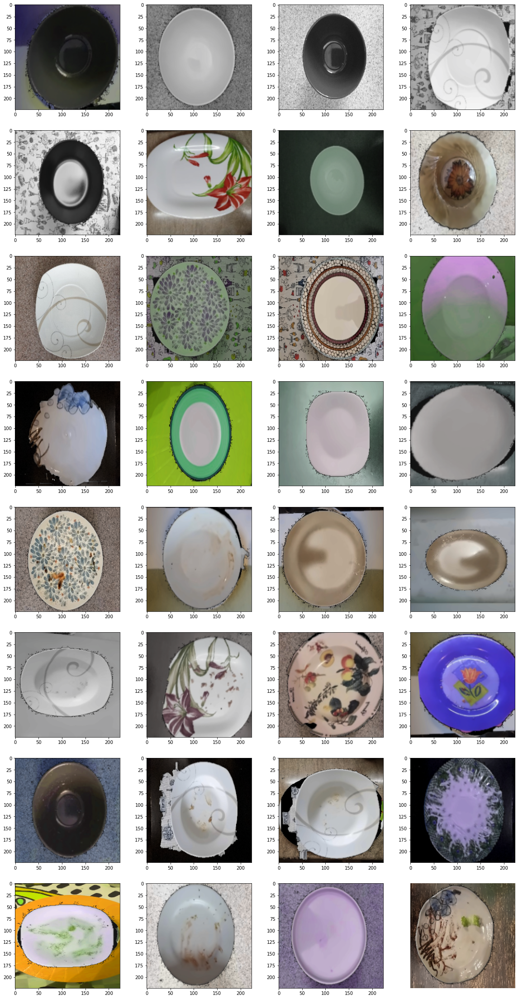



 Validation 




100%|██████████| 2/2 [00:00<00:00, 51.10it/s]


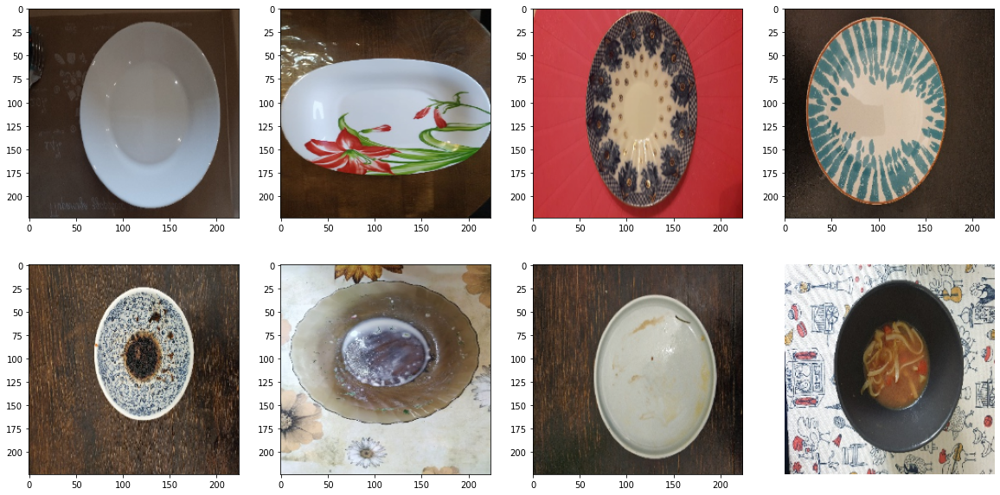

In [ ]:
print('\n\n Train \n\n')
plot_grid([img for img, _ in train_dataset], cols=4)
print('\n\n Validation \n\n')
plot_grid([img for img, _ in val_dataset], cols=4)

# Metrics

In [ ]:
from typing import Tuple, Dict, Callable
from matplotlib import pyplot as plt
import math

def estimate_model(model: nn.Module, 
                   test_dataloader: torch.utils.data.DataLoader, 
                   loss: Callable, 
                   iterations: int = 5) -> Tuple[float, float]:
    """Return: (loss, acc)"""
    model.eval()
    device = next(iter(model.parameters()))[0].device
    run_loss = 0
    run_acc = 0
    for _ in range(iterations):
        for data, labels in test_dataloader:
            labels = labels.to(device).float()
            data = data.to(device)

            with torch.set_grad_enabled(False):
                preds = model(data).squeeze()
                run_loss += loss(preds, labels).cpu().item()
                run_acc += accuracy(preds, labels)
    avg_loss = run_loss / len(test_dataloader) / iterations
    avg_acc = run_acc / len(test_dataloader) / iterations
    return avg_loss, avg_acc

def estimate_model_f1(model: nn.Module, 
                      test_dataloader: torch.utils.data.DataLoader,
                      iterations: int = 5) -> Tuple[float, float, float]:
    """Return: (precision, recall, f1_score)"""
    model.eval()
    device = next(iter(model.parameters()))[0].device
    run_precision = 0
    run_recall = 0
    for _ in range(iterations):
        for data, labels in test_dataloader:
            labels = labels.to(device).float()
            data = data.to(device)

            with torch.set_grad_enabled(False):
                preds = model(data).squeeze()
                run_precision += precision_func(preds, labels)
                run_recall += recall_func(preds, labels)
    
    avg_recall = run_recall / len(test_dataloader) / iterations
    avg_precision = run_precision / len(test_dataloader) / iterations
    avg_f1_score = f1_score_func(avg_precision, avg_recall)
    return avg_precision, avg_recall, avg_f1_score

def get_class(preds: Tensor) -> Tensor:
    """Converts floats value to bools 0/1
        Return: tensor of ints
    """
    return (preds > THRESHOLD).int()

def accuracy(preds: Tensor, labels: Tensor) -> float:
    """Calculate accuracy as mean of true answers.
        Return: Single mean accuracy as float value
    """
    preds_class = get_class(preds)
    labels_class = get_class(labels)
    return (preds_class == labels_class).float().mean().cpu().item()

def true_positives(preds: Tensor, labels: Tensor) -> int:
    preds_class = get_class(preds).cpu()
    labels_class = get_class(labels)
    return (preds_class * labels_class.data.cpu()).sum().item()

def precision_func(preds: Tensor, labels: Tensor) -> float:
    preds_class = get_class(preds)
    tp_fp = preds_class.sum().item()
    if tp_fp != 0:    
        return true_positives(preds, labels) / tp_fp
    else:
        return 2

def recall_func(preds: Tensor, labels: Tensor) -> float:
    tp_fn = labels.sum().item()
    if tp_fn != 0:
        return true_positives(preds, labels) / tp_fn
    else:
        return 2
        
def f1_score_func(precision: float, recall: float) -> float:
    if precision == 0 or recall == 0:
        return 0
    else:
        return 2 / (1/precision + 1/recall)


# Train functions

In [ ]:
import statistics

def train_model(model: nn.Module, 
                train_dataloader: torch.utils.data.DataLoader, 
                val_dataloader: torch.utils.data.DataLoader,
                loss: Callable, 
                optimizer: torch.optim.Optimizer, 
                scheduler, 
                history: dict, 
                num_epochs: int,
                mode: str = None, 
                verbose: bool = False,
                add_loss_to_scheduler: bool = False,
                window_width: int = 5,   
                tb: Union[SummaryWriter, None] = None) -> Tuple[nn.Module, float, float]:
    """Returns: (model, loss, acc)"""
    assert mode in ['best_loss', 'best_acc', None]
    if tb is None: tb = SummaryWriter()

    best_smoothed_loss = 9999999
    best_smoothed_acc = 0
    best_loss_weights_path = os.path.join(WEIGHTS_ROOT, 'best_loss_weights.pt') 
    best_acc_weights_path = os.path.join(WEIGHTS_ROOT, 'best_acc_weights.pt')

    best_epoch = 0
    weights = []

    pbar = tqdm(range(num_epochs))
    for epoch in pbar:
        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                dataloader = train_dataloader
                model.train()  # Set model to training mode
            else:
                dataloader = val_dataloader
                model.eval()   # Set model to evaluate mode

            running_loss = 0.
            running_acc = 0.

            # Iterate over data.
            for inputs, labels in dataloader:
                inputs = inputs.to(DEVICE)
                labels = labels.to(DEVICE).float()

                optimizer.zero_grad()

                # Forward and backward
                with torch.set_grad_enabled(phase == 'train'):
                    preds = model(inputs).squeeze()
                    loss_value = loss(preds, labels)
                    preds_class = get_class(preds)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss_value.backward()
                        optimizer.step()
                        if add_loss_to_scheduler:
                            scheduler.step(loss_value)
                        else:
                            scheduler.step()

                # Statistics
                running_loss += loss_value.item()
                running_acc += (preds_class == labels.data).float().mean().cpu().item()

            epoch_loss = running_loss / len(dataloader)
            epoch_acc = running_acc / len(dataloader)
            epoch_precision, epoch_recall, epoch_f1 = estimate_model_f1(model, dataloader)

            
            # Save statistics to history
            if phase == 'train':
                history['train_loss'].append(epoch_loss)
                history['train_acc'].append(epoch_acc)
                history['train_precision'].append(epoch_precision)
                history['train_recall'].append(epoch_recall)
                history['train_f1'].append(epoch_f1)

                tb.add_scalars('loss', {'train': epoch_loss}, epoch)
                tb.add_scalars('acc', {'train': epoch_acc}, epoch)
                tb.add_scalar('train_loss', epoch_loss, epoch)
                tb.add_scalar('train_acc', epoch_acc, epoch)
                tb.add_scalar('train_precision', epoch_precision, epoch)
                tb.add_scalar('train_recall', epoch_recall, epoch)
                tb.add_scalar('train_f1', epoch_f1, epoch)

            else:
                history['val_loss'].append(epoch_loss)
                history['val_acc'].append(epoch_acc)
                history['val_precision'].append(epoch_precision)
                history['val_recall'].append(epoch_recall)
                history['val_f1'].append(epoch_f1)
                
                tb.add_scalars('loss', {'val': epoch_loss}, epoch)
                tb.add_scalars('acc', {'val': epoch_acc}, epoch)
                tb.add_scalar('val_loss', epoch_loss, epoch)
                tb.add_scalar('val_acc', epoch_acc, epoch)
                tb.add_scalar('val_precision', epoch_precision, epoch)
                tb.add_scalar('val_recall', epoch_recall, epoch)
                tb.add_scalar('val_f1', epoch_f1, epoch)
                
        
        #  Save model each 10 rpochs
        if epoch % 10 == 0:
            torch.save(model.state_dict(), os.path.join(WEIGHTS_ROOT, f'weights_epoch_{epoch}'))
        
        # Save best model
        window_loss = history['val_loss'][-window_width:]
        window_acc = history['val_acc'][-window_width:]

        window_smoothed_loss = round(statistics.median(window_loss), 4)
        window_smoothed_acc = round(statistics.median(window_acc), 4)

        weights.append(model.state_dict())
        weights = weights[-window_width:]
        center_window_model_index = math.floor(len(weights) / 2)
        center_model_weights = weights[center_window_model_index]

        if mode == 'best_loss':   
            if window_smoothed_loss < best_smoothed_loss:
                torch.save(center_model_weights, best_loss_weights_path)
                best_smoothed_loss = window_smoothed_loss
                best_epoch = epoch - center_window_model_index # shift to window center
                if verbose: print('best_smoothed_loss = {}'.format(best_smoothed_loss))

                if window_smoothed_acc > best_smoothed_acc:
                    best_smoothed_acc = window_smoothed_acc
                    if verbose: print('best_smoothed_acc = {}'.format(best_smoothed_acc))
            
            elif window_smoothed_loss == best_smoothed_loss:
                if window_smoothed_acc > best_smoothed_acc:
                    torch.save(center_model_weights, best_loss_weights_path)
                    best_smoothed_acc = window_smoothed_acc
                    best_epoch = epoch - center_window_model_index # shift to window center
                    if verbose: print('best_smoothed_acc = {}'.format(best_smoothed_acc))
        
        elif mode == 'best_acc':
            if window_smoothed_acc > best_smoothed_acc:
                torch.save(center_model_weights, best_acc_weights_path)
                best_smoothed_acc = window_smoothed_acc
                best_epoch = epoch - center_window_model_index # shift to window center
                if verbose: print('best_smoothed_acc = {}'.format(best_smoothed_acc))
     
                if window_smoothed_loss < best_smoothed_loss:
                    best_smoothed_loss = window_smoothed_loss
                    if verbose: print('best_smoothed_loss = {}'.format(best_smoothed_loss))
     
            elif window_smoothed_acc == best_smoothed_acc:
                if window_smoothed_loss < best_smoothed_loss:
                    torch.save(center_model_weights, best_acc_weights_path)
                    best_smoothed_loss = window_smoothed_loss
                    best_epoch = epoch - center_window_model_index # shift to window center
                    if verbose: print('best_smoothed_loss = {}'.format(best_smoothed_loss))

        # Update tensorboard data
        tb.flush()
        # Update pbar description 
        pbar.set_description('Train loss: {:.4f} acc: {:.4f} precision: {:.4f} recall: {:.4f} f1: {:.4f} | Val loss: {:.4f} acc: {:.4f} precision: {:.4f} recall: {:.4f} f1: {:.4f}'
                             .format(history['train_loss'][-1],
                                     history['train_acc'][-1],
                                     history['train_precision'][-1],
                                     history['train_recall'][-1],
                                     history['train_f1'][-1],
                                     history['val_loss'][-1],
                                     history['val_acc'][-1],
                                     history['val_precision'][-1],
                                     history['val_recall'][-1],
                                     history['val_f1'][-1]))

    # Close tensorboard summary writer
    tb.close()

    # Save finish weights
    finish_weights_path = os.path.join(WEIGHTS_ROOT, 'finish_weights.pt')
    torch.save(model.state_dict(), finish_weights_path)

    # Choose the best model
    if mode == 'best_loss':
        print(f'\nUse {mode} model from epoch {best_epoch}')
        model.load_state_dict(torch.load(best_loss_weights_path))
    elif mode == 'best_acc':
        model.load_state_dict(torch.load(best_acc_weights_path))
        print(f'\nUse {mode} model from epoch {best_epoch}')
    else:
        print(f'\n*** Use finish trained model ***')
        
    return (model,) + estimate_model(model, val_dataloader, loss)

# Model, optimiser, scheduler makers

In [ ]:
def make_model(freeze_until: str='none', 
               verbose: bool = False, 
               deterministic: bool = False) -> nn.Module:
    if deterministic:
        random.seed(0)
        np.random.seed(0)
        torch.manual_seed(0)
        torch.cuda.manual_seed(0)
        torch.backends.cudnn.deterministic = False
    
    model = models.resnet18(pretrained=True)

    # Freeze only N layers up to selected layer
    for name, child in model.named_children():
        if name == freeze_until:
            break
        if name == 'fc': 
            continue
        
        for param in child.parameters():
            param.requires_grad = False
        if verbose: print(f'Layer "{name}" is freezed')


    model.fc = nn.Sequential(
        torch.nn.Linear(model.fc.in_features, 1),
        torch.nn.Sigmoid()
    )

    if verbose: 
        print('\nModel layers:')
        for name, _ in model.named_children():
            print(' ', name)

    return model

def make_optimizer(model_params, 
                   lr=LEARNING_RATE, 
                   *args, **kwargs
                   ) -> torch.optim.Optimizer:
    optimizer = torch.optim.Adam(model_params, lr=lr, *args, **kwargs)
    return optimizer

def make_scheduler(optimizer: torch.optim.Optimizer):
    return torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', verbose=True)

def make_loss():
    return nn.BCELoss()

# Training

## Make model

In [ ]:
%rm -fr /content/runs/*

tb = SummaryWriter()
tb.add_scalar('tmp', 0)
tb.close()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
from torch.utils.tensorboard import SummaryWriter
import copy

model = make_model('layer4', verbose=True, deterministic=True).to(DEVICE)
history = copy.deepcopy(HISTORY_TEMPLATE)
tb = SummaryWriter()
images, _ = next(iter(val_dataloader))
tb.add_graph(model, images.to(DEVICE))
tb.close()

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer "conv1" is freezed
Layer "bn1" is freezed
Layer "relu" is freezed
Layer "maxpool" is freezed
Layer "layer1" is freezed
Layer "layer2" is freezed
Layer "layer3" is freezed

Model layers:
  conv1
  bn1
  relu
  maxpool
  layer1
  layer2
  layer3
  layer4
  avgpool
  fc


## Train with Adam

Train loss: 0.0014 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.6022 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  48%|████▊     | 48/100 [01:05<01:04,  1.24s/it]

Epoch 00049: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0006 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.6360 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  66%|██████▌   | 66/100 [01:27<00:42,  1.25s/it]

Epoch 00067: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0134 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.9227 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  77%|███████▋  | 77/100 [01:41<00:28,  1.23s/it]

Epoch 00078: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0007 acc: 1.0000 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 12.9146 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  95%|█████████▌| 95/100 [02:03<00:06,  1.25s/it]

Epoch 00096: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0025 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.6570 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:10<00:00,  1.30s/it]



Use best_acc model from epoch 24
model_loss = 12.571629333496094 | model_acc = 0.825
--------- Train --------------
loss: 1.4929362586321075, acc: 0.9375
precision: 0.9529411764705882, recall: 1.0, f1_score: 0.9759036144578312
--------- Validation --------------
loss: 12.641770935058593, acc: 0.775
precision: 0.76, recall: 0.8, f1_score: 0.7794871794871795


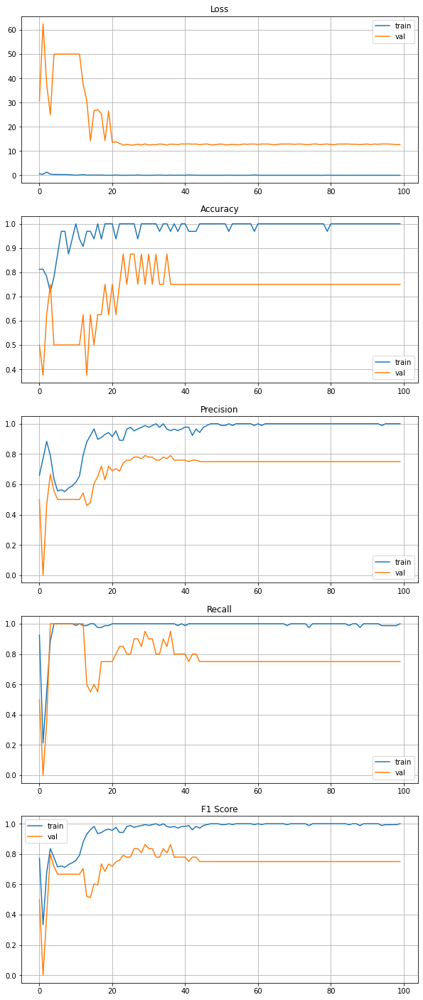

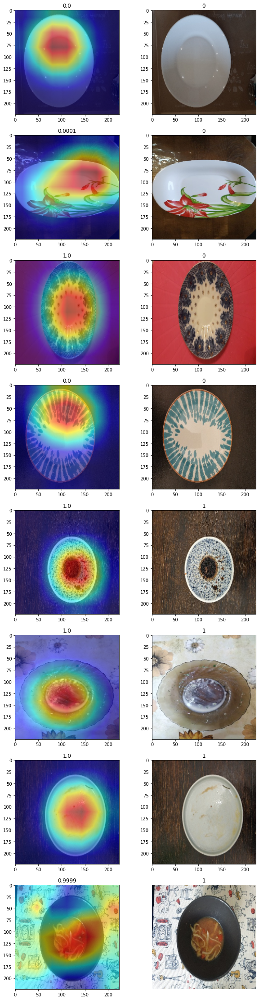

In [ ]:
optimizer = make_optimizer(model.parameters(), lr=LEARNING_RATE)
scheduler = make_scheduler(optimizer)
loss = make_loss()

best_loss_weights_path = os.path.join(WEIGHTS_ROOT, 'best_loss_weights.pt') 
best_acc_weights_path = os.path.join(WEIGHTS_ROOT, 'best_acc_weights.pt')
best_model_loss = 999999
best_model_acc = 0

try:
    _, model_loss, model_acc = train_model(model, 
                                           train_dataloader, 
                                           val_dataloader, 
                                           loss, 
                                           optimizer, 
                                           scheduler, 
                                           history, 
                                           num_epochs=NUM_EPOCHS, 
                                           mode=TRAINING_MODE,
                                           add_loss_to_scheduler=True)
finally:
    print('--------- Train --------------')
    print('loss: {}, acc: {}'.format(*estimate_model(model, train_dataloader, loss)))
    print('precision: {}, recall: {}, f1_score: {}'.format(*estimate_model_f1(model, train_dataloader)))
    print('--------- Validation --------------')
    print('loss: {}, acc: {}'.format(*estimate_model(model, val_dataloader, loss)))
    print('precision: {}, recall: {}, f1_score: {}'.format(*estimate_model_f1(model, val_dataloader)))


    plot_history(history)
    images, labels = next(iter(val_dataloader))
    show_heatmap(model, images, labels)
    

# Ensemble

## Train N times

In [ ]:
def train_n_times(train_dataloader: torch.utils.data.DataLoader, 
                  val_dataloader: torch.utils.data.DataLoader, 
                  iterations: int = 5, 
                  freeze_until: str = 'layer4') -> Tuple[nn.Module, dict]:
    """Trains model N times (default = 5).
        Return: Tuple[the_best_model, the_best_model_history]
    """
    best_model_loss_weights_path = os.path.join(WEIGHTS_ROOT, 'best_loss_weights.pt') 
    best_model_acc_weights_path = os.path.join(WEIGHTS_ROOT, 'best_model_acc_weights.pt')
    best_model_loss = 999999
    best_model_acc = 0

    verbose_model = True
    for i in range(iterations):
        print(f"*** Iteration - {i + 1} ***")
        model = make_model(freeze_until, verbose=verbose_model, deterministic=False).to(DEVICE)
        verbose_model = False
        history = copy.deepcopy(HISTORY_TEMPLATE)

        optimizer = make_optimizer(model.parameters(), lr=LEARNING_RATE)
        scheduler = make_scheduler(optimizer)
        loss = make_loss()

        tb = SummaryWriter(comment=f'iter_{i + 1}')

        # Training
        _, model_loss, model_acc = train_model(model, 
                                            train_dataloader, 
                                            val_dataloader, 
                                            loss, 
                                            optimizer, 
                                            scheduler, 
                                            history, 
                                            num_epochs=NUM_EPOCHS, 
                                            mode=TRAINING_MODE,
                                            add_loss_to_scheduler=True,
                                            tb=tb)
        
        print('--------- Train ----------')
        model_train_loss, model_train_acc = estimate_model(model, train_dataloader, loss)
        print('loss: {}, acc: {}'.format(model_train_loss, model_train_acc))
        print('precision: {}, recall: {}, f1_score: {}'.format(*estimate_model_f1(model, train_dataloader)))
        
        print('--------- Validation ----------')
        model_val_loss, model_val_acc = estimate_model(model, val_dataloader, loss)
        print('loss: {}, acc: {}'.format(model_val_loss, model_val_acc))
        print('precision: {}, recall: {}, f1_score: {}'.format(*estimate_model_f1(model, val_dataloader)))

        if model_val_acc > best_model_acc:
            torch.save(model.state_dict(), best_model_acc_weights_path)
            best_model_acc = model_val_acc
            best_model_loss = model_val_loss
            best_model_history = history 
            print('--> best_model_acc = {}\n'.format(best_model_acc))
        
        if model_val_acc == best_model_acc:
            if model_val_loss < best_model_loss:
                torch.save(model.state_dict(), best_model_acc_weights_path)
                best_model_acc = model_val_acc
                best_model_loss = model_val_loss
                best_model_history = history 
                print('--> best_model_acc = {} | best_model_loss = {}\n'.format(best_model_acc, best_model_loss))
        

    print('\n\n **************************')
    #  Take best model
    model.load_state_dict(torch.load(best_model_acc_weights_path))

    print('Chosen model:\n')
    print('--------- Train ----------')
    model_train_loss, model_train_acc = estimate_model(model, train_dataloader, loss)
    print('loss: {}, acc: {}'.format(model_train_loss, model_train_acc))
    print('precision: {}, recall: {}, f1_score: {}'.format(*estimate_model_f1(model, train_dataloader)))

    print('--------- Validation ----------')
    model_val_loss, model_val_acc = estimate_model(model, val_dataloader, loss)
    print('loss: {}, acc: {}'.format(model_val_loss, model_val_acc))
    print('precision: {}, recall: {}, f1_score: {}'.format(*estimate_model_f1(model, val_dataloader)))

    return model, best_model_history

## Class

In [ ]:
class Ensemble():
    def __init__(self, models: List[nn.Module]):
        self.models = copy.deepcopy(models)
    
    def __call__(self, X: torch.Tensor):
        with torch.set_grad_enabled(False):
            preds = torch.stack([m(X) for m in self.models], dim=0)
            preds = preds.sum(0) / 5
        return preds
    
    def __getitem__(self, index):
        return self.models[index]
    
    def __len__(self):
        return len(self.models)
    
    def eval(self) -> None:
        for m in self.models:
            m.eval()
        
    def parameters(self):
        for m in self.models:
            for param in m.parameters():
                yield param 
    def to(self, device):
        for m in self.models:
            m.to(device)
    
    def cpu(self):
        for m in self.models:
            m.cpu()

    def cuda(self):
        for m in self.models:
            m.cuda()


## Train

In [ ]:
%rm -fr /content/runs

tb = SummaryWriter()
tb.add_scalar('tmp', 0)
tb.close()

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

In [ ]:
from sklearn.model_selection import KFold, StratifiedKFold
from statistics import mean

print('Use device:', DEVICE)

n_splits = 5
skfold = StratifiedKFold(n_splits=n_splits)

history_ensamble = [copy.deepcopy(HISTORY_TEMPLATE) for _ in range(n_splits)]
train_dataset_ensamble = AlbumentationsDataset(os.path.join(DATA_ROOT, 'train'), 
                                               albumentations_train_transforms, 
                                               mixup=False,
                                               background_mode='shuffle')
val_dataset_ensamble = AlbumentationsDataset(os.path.join(DATA_ROOT, 'train'), 
                                             albumentations_val_transforms,
                                             background_mode='none')

ensemble_val_dataloader = torch.utils.data.DataLoader(val_dataset_ensamble, 
                                                      batch_size=len(val_dataset_ensamble), 
                                                      shuffle=False, 
                                                      num_workers=num_workers)

loss = make_loss()

losses_train = []
accs_train = []
f1_scores_train = []
losses_val = []
accs_val = []
f1_scores_val = []
ensemble_models = []


labels = np.array([label for path, label, class_name in train_dataset_ensamble.labeled_images])
indexes = np.arange(len(train_dataset_ensamble))

for num_fold, (train_indexes, val_indexes) in enumerate(skfold.split(indexes, labels)):
 
    print(f'\n\n*** FOLD - {num_fold + 1} ***')
    print(f'[Clead, dirty] count: Train {np.bincount(labels[train_indexes])}    Val {np.bincount(labels[val_indexes])}')
    print(f'Train indexes:', train_indexes)
    print(f'Val indexes:', val_indexes)
    tb = SummaryWriter(comment=f'fold_{num_fold}')
    # Make subsets
    train_subset = torch.utils.data.Subset(train_dataset_ensamble, train_indexes)
    val_subset = torch.utils.data.Subset(val_dataset_ensamble, val_indexes)
    # Make dataloaders
    train_dataloader_ensamble = torch.utils.data.DataLoader(train_subset, train_batch_size, shuffle=True, num_workers=num_workers)
    val_dataloader_ensamble = torch.utils.data.DataLoader(val_subset, val_batch_size, shuffle=False, num_workers=num_workers)
    # Make and setup model
    model, history_ensamble[num_fold] = train_n_times(train_dataloader, val_dataloader, iterations=5, freeze_until='layer4')
    
    #  Add model to ensemble
    ensemble_models.append(model)
    # Calculate metrics

    loss_val, acc_val = estimate_model(model, val_dataloader_ensamble, loss)
    precision_val, recal_val, f1_val = estimate_model_f1(model, val_dataloader_ensamble)

    loss_train, acc_train = estimate_model(model, train_dataloader_ensamble, loss)
    precision_train, recal_train, f1_train = estimate_model_f1(model, train_dataloader_ensamble)

    print('--------- Validation model metrics ----------')
    print('loss: {:.4f}, acc: {:.4f}'.format(loss_val, acc_val))
    print('precision: {:.4f}, recall: {:.4f}, f1_score: {:.4f}'.format(precision_val, recal_val, f1_val))
    print('--------- Train model metrics ----------')
    print('loss: {:.4f}, acc: {:.4f}'.format(loss_train, acc_train))
    print('precision: {:.4f}, recall: {:.4f}, f1_score: {:.4f}'.format(precision_train, recal_train, f1_train))


    print('\n ------------- Validation means -------------')
    losses_val.append(loss_val)
    accs_val.append(acc_val)
    f1_scores_val.append(f1_val)
    print(f'Losses: {losses_val} | Mean: {mean(losses_val)}')
    print(f'Accs: {accs_val} | Mean: {mean(accs_val)}')
    print(f'F1 scores: {f1_scores_val} | Mean: {mean(f1_scores_val)}')
    print('------------- Train means -------------')
    losses_train.append(loss_train)
    accs_train.append(acc_train)
    f1_scores_train.append(f1_train)
    print(f'Losses: {losses_train} | Mean: {mean(losses_train)}')
    print(f'Accs: {accs_train} | Mean: {mean(accs_train)}')
    print(f'F1 scores: {f1_scores_train} | Mean: {mean(f1_scores_train)}')
    
print('***************************************')
print('************* FINAL *******************')
print('***************************************')

print('------------- Train means -------------')
print(f'Losses: {losses_train} | Mean: {mean(losses_train)}')
print(f'Accs: {accs_train} | Mean: {mean(accs_train)}')
print(f'F1 scores: {f1_scores_train} | Mean: {mean(f1_scores_train)}')

print('\n ------------- Validation means -------------')
print(f'Losses: {losses_val} | Mean: {mean(losses_val)}')
print(f'Accs: {accs_val} | Mean: {mean(accs_val)}')
print(f'F1 scores: {f1_scores_val} | Mean: {mean(f1_scores_val)}')

#  Save ensemble models
%rm -fr {ENSEMBLE_ROOT}/*
for i, mod in enumerate(ensemble_models):
    torch.save(mod.state_dict(), os.path.join(ENSEMBLE_ROOT, f'ensemble_model_{i}.pt'))

# Estimate ensemble
model = Ensemble(ensemble_models)
ensemble_loss, ensemble_acc = estimate_model(model, ensemble_val_dataloader, make_loss())
print("============================================")
print("\n\n *********** Ensemble ******************")
print("============================================")
print(f'loss = {ensemble_loss} | acc = {ensemble_acc}')

Use device: cuda:0


Separate backgrounds /content/plates/train/cleaned: 100%|██████████| 20/20 [00:32<00:00,  1.62s/it]
Separate backgrounds /content/plates/train/dirty: 100%|██████████| 20/20 [00:33<00:00,  1.67s/it]


Make dir /content/memo/train/cleaned
Make dir /content/memo/train/dirty


Save plates to /content/memo/train: 100%|██████████| 40/40 [00:00<00:00, 840.70it/s]




*** FOLD - 1 ***
[Clead, dirty] count: Train [16 16]    Val [4 4]
Train indexes: [ 4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 24 25 26 27 28 29 30 31
 32 33 34 35 36 37 38 39]
Val indexes: [ 0  1  2  3 20 21 22 23]
*** Iteration - 1 ***


/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer "conv1" is freezed
Layer "bn1" is freezed
Layer "relu" is freezed
Layer "maxpool" is freezed
Layer "layer1" is freezed
Layer "layer2" is freezed
Layer "layer3" is freezed

Model layers:
  conv1
  bn1
  relu
  maxpool
  layer1
  layer2
  layer3
  layer4
  avgpool
  fc


Train loss: 0.0497 acc: 1.0000 precision: 0.9867 recall: 0.8000 f1: 0.8836 | Val loss: 14.9658 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  26%|██▌       | 26/100 [00:34<01:33,  1.27s/it]

Epoch 00027: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0313 acc: 1.0000 precision: 0.9647 recall: 0.9875 f1: 0.9760 | Val loss: 12.9677 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  40%|████      | 40/100 [00:53<01:24,  1.41s/it]

Epoch 00041: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0068 acc: 1.0000 precision: 0.9757 recall: 0.9625 f1: 0.9691 | Val loss: 12.8882 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  51%|█████     | 51/100 [01:08<01:04,  1.32s/it]

Epoch 00052: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0234 acc: 1.0000 precision: 1.0000 recall: 0.9625 f1: 0.9809 | Val loss: 12.8018 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  62%|██████▏   | 62/100 [01:22<00:50,  1.32s/it]

Epoch 00063: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0088 acc: 1.0000 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 2.2431 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  77%|███████▋  | 77/100 [01:41<00:28,  1.26s/it]

Epoch 00078: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0130 acc: 1.0000 precision: 0.9647 recall: 0.9875 f1: 0.9760 | Val loss: 2.2392 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  88%|████████▊ | 88/100 [01:55<00:14,  1.25s/it]

Epoch 00089: reducing learning rate of group 0 to 1.0000e-08.


Train loss: 0.0093 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 2.1543 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:10<00:00,  1.31s/it]



Use best_acc model from epoch 78
--------- Train ----------
loss: 0.04802540950477123, acc: 0.975
precision: 0.9882352941176471, recall: 0.9875, f1_score: 0.9878675102344622
--------- Validation ----------
loss: 2.249109220504761, acc: 0.75
precision: 0.75, recall: 0.75, f1_score: 0.75
--> best_model_acc = 0.75

*** Iteration - 2 ***


Train loss: 0.0270 acc: 0.9688 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 12.5024 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  50%|█████     | 50/100 [01:04<01:02,  1.25s/it]

Epoch 00051: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0031 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5034 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  63%|██████▎   | 63/100 [01:20<00:46,  1.26s/it]

Epoch 00064: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0104 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5374 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  74%|███████▍  | 74/100 [01:34<00:32,  1.26s/it]

Epoch 00075: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0042 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.6593 acc: 0.7500 precision: 0.7800 recall: 0.9000 f1: 0.8357:  85%|████████▌ | 85/100 [01:48<00:18,  1.25s/it]

Epoch 00086: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0402 acc: 0.9688 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 12.5304 acc: 0.8750 precision: 0.7700 recall: 0.8500 f1: 0.8080:  96%|█████████▌| 96/100 [02:02<00:05,  1.26s/it]

Epoch 00097: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0825 acc: 0.9688 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.6928 acc: 0.7500 precision: 0.7800 recall: 0.9000 f1: 0.8357: 100%|██████████| 100/100 [02:07<00:00,  1.27s/it]



Use best_acc model from epoch 49
--------- Train ----------
loss: 0.06801709206774831, acc: 0.9875
precision: 0.9882352941176471, recall: 1.0, f1_score: 0.9940828402366864
--------- Validation ----------
loss: 12.514403533935546, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--> best_model_acc = 0.875

*** Iteration - 3 ***


Train loss: 0.0403 acc: 0.9688 precision: 1.0000 recall: 0.8750 f1: 0.9333 | Val loss: 12.5035 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  39%|███▉      | 39/100 [00:51<01:20,  1.32s/it]

Epoch 00040: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0074 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5088 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  50%|█████     | 50/100 [01:05<01:02,  1.25s/it]

Epoch 00051: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0029 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5488 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  61%|██████    | 61/100 [01:19<00:50,  1.29s/it]

Epoch 00062: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0954 acc: 0.9688 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5188 acc: 0.8750 precision: 0.7700 recall: 0.8500 f1: 0.8080:  72%|███████▏  | 72/100 [01:33<00:35,  1.26s/it]

Epoch 00073: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0111 acc: 1.0000 precision: 0.9882 recall: 0.9750 f1: 0.9816 | Val loss: 12.5285 acc: 0.8750 precision: 0.7600 recall: 0.8000 f1: 0.7795:  83%|████████▎ | 83/100 [01:47<00:21,  1.26s/it]

Epoch 00084: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0147 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 12.6258 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795:  94%|█████████▍| 94/100 [02:01<00:07,  1.25s/it]

Epoch 00095: reducing learning rate of group 0 to 1.0000e-08.


Train loss: 0.0732 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.7916 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795: 100%|██████████| 100/100 [02:08<00:00,  1.28s/it]



Use best_acc model from epoch 33
--------- Train ----------
loss: 0.09477587437722831, acc: 0.96875
precision: 0.9529411764705882, recall: 1.0, f1_score: 0.9759036144578312
--------- Validation ----------
loss: 12.501924133300781, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--> best_model_acc = 0.875 | best_model_loss = 12.501924133300781

*** Iteration - 4 ***


Train loss: 0.1566 acc: 0.9375 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 12.5427 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  54%|█████▍    | 54/100 [01:09<00:57,  1.25s/it]

Epoch 00055: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0640 acc: 0.9688 precision: 0.9875 recall: 0.9875 f1: 0.9875 | Val loss: 12.5835 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  68%|██████▊   | 68/100 [01:27<00:39,  1.24s/it]

Epoch 00069: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0061 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5549 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  79%|███████▉  | 79/100 [01:41<00:26,  1.25s/it]

Epoch 00080: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.1037 acc: 0.9375 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5502 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  90%|█████████ | 90/100 [01:54<00:12,  1.24s/it]

Epoch 00091: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0022 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5466 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889: 100%|██████████| 100/100 [02:07<00:00,  1.28s/it]



Use best_acc model from epoch 37
--------- Train ----------
loss: 0.1865492556244135, acc: 0.95625
precision: 0.9660130718954247, recall: 0.9875, f1_score: 0.9766383672786585
--------- Validation ----------
loss: 12.93211097717285, acc: 0.75
precision: 0.7466666666666666, recall: 1.0, f1_score: 0.8549618320610687
*** Iteration - 5 ***


Train loss: 0.1767 acc: 0.9062 precision: 0.9778 recall: 1.0000 f1: 0.9888 | Val loss: 12.5126 acc: 0.8750 precision: 0.7200 recall: 1.0000 f1: 0.8372:  37%|███▋      | 37/100 [00:48<01:24,  1.33s/it]

Epoch 00038: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0075 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5069 acc: 0.8750 precision: 0.7733 recall: 1.0000 f1: 0.8722:  58%|█████▊    | 58/100 [01:15<00:52,  1.24s/it]

Epoch 00059: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0050 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5219 acc: 0.8750 precision: 0.7467 recall: 1.0000 f1: 0.8550:  73%|███████▎  | 73/100 [01:34<00:34,  1.27s/it]

Epoch 00074: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0072 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.6801 acc: 0.7500 precision: 0.7733 recall: 1.0000 f1: 0.8722:  86%|████████▌ | 86/100 [01:50<00:17,  1.26s/it]

Epoch 00087: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0139 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5416 acc: 0.8750 precision: 0.7733 recall: 1.0000 f1: 0.8722:  99%|█████████▉| 99/100 [02:06<00:01,  1.25s/it]

Epoch 00100: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0118 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5413 acc: 0.8750 precision: 0.7467 recall: 1.0000 f1: 0.8550: 100%|██████████| 100/100 [02:08<00:00,  1.28s/it]



Use best_acc model from epoch 57
--------- Train ----------
loss: 0.005431274604052305, acc: 1.0
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 12.566651916503906, acc: 0.85
precision: 0.7733333333333332, recall: 1.0, f1_score: 0.8721804511278195


 **************************
Chosen model:

--------- Train ----------
loss: 0.058250995352864265, acc: 0.98125
precision: 1.0, recall: 0.95, f1_score: 0.9743589743589745
--------- Validation ----------
loss: 12.501115226745606, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--------- Validation model metrics ----------
loss: 0.0068, acc: 1.0000
precision: 1.0000, recall: 1.0000, f1_score: 1.0000
--------- Train model metrics ----------
loss: 3.3929, acc: 0.9062
precision: 0.9067, recall: 0.9500, f1_score: 0.9278

 ------------- Validation means -------------
Losses: [0.006825134432983759] | Mean: 0.006825134432983759
Accs: [1.0] | Mean: 1.0
F1 scores: [1.0] | Mean: 1.0
------------- Tr

Train loss: 0.0296 acc: 1.0000 precision: 0.9732 recall: 0.9500 f1: 0.9615 | Val loss: 12.5012 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  42%|████▏     | 42/100 [00:55<01:17,  1.33s/it]

Epoch 00043: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0475 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5177 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  53%|█████▎    | 53/100 [01:09<00:58,  1.25s/it]

Epoch 00054: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0359 acc: 0.9688 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 12.5010 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  64%|██████▍   | 64/100 [01:23<00:46,  1.30s/it]

Epoch 00065: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0441 acc: 0.9688 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 12.5392 acc: 0.8750 precision: 0.7200 recall: 1.0000 f1: 0.8372:  75%|███████▌  | 75/100 [01:37<00:31,  1.26s/it]

Epoch 00076: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0038 acc: 1.0000 precision: 0.9449 recall: 1.0000 f1: 0.9717 | Val loss: 1.7948 acc: 0.8750 precision: 0.7733 recall: 1.0000 f1: 0.8722:  86%|████████▌ | 86/100 [01:51<00:17,  1.25s/it]

Epoch 00087: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.1753 acc: 0.9688 precision: 0.9660 recall: 1.0000 f1: 0.9827 | Val loss: 1.7741 acc: 0.8750 precision: 0.7467 recall: 1.0000 f1: 0.8550:  97%|█████████▋| 97/100 [02:05<00:03,  1.23s/it]

Epoch 00098: reducing learning rate of group 0 to 1.0000e-08.


Train loss: 0.0361 acc: 0.9688 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.7503 acc: 0.8750 precision: 0.7733 recall: 1.0000 f1: 0.8722: 100%|██████████| 100/100 [02:08<00:00,  1.29s/it]



Use best_acc model from epoch 78
--------- Train ----------
loss: 0.04315219952841289, acc: 0.975
precision: 0.9764705882352942, recall: 1.0, f1_score: 0.9880952380952381
--------- Validation ----------
loss: 8.35323657989502, acc: 0.825
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--> best_model_acc = 0.825

*** Iteration - 2 ***


Train loss: 0.1753 acc: 0.9688 precision: 0.9882 recall: 0.9750 f1: 0.9816 | Val loss: 13.2035 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  48%|████▊     | 48/100 [01:01<01:04,  1.25s/it]

Epoch 00049: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0787 acc: 0.9688 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 1.8929 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  59%|█████▉    | 59/100 [01:15<00:50,  1.23s/it]

Epoch 00060: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0619 acc: 0.9688 precision: 1.0000 recall: 0.9500 f1: 0.9744 | Val loss: 2.1716 acc: 0.7500 precision: 0.7700 recall: 0.8500 f1: 0.8080:  70%|███████   | 70/100 [01:28<00:37,  1.26s/it]

Epoch 00071: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0783 acc: 0.9688 precision: 0.9778 recall: 0.9625 f1: 0.9701 | Val loss: 1.9786 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  81%|████████  | 81/100 [01:42<00:24,  1.29s/it]

Epoch 00082: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0513 acc: 0.9688 precision: 0.9875 recall: 0.9375 f1: 0.9619 | Val loss: 2.2227 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  92%|█████████▏| 92/100 [01:56<00:10,  1.27s/it]

Epoch 00093: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0221 acc: 1.0000 precision: 0.9750 recall: 0.9375 f1: 0.9559 | Val loss: 12.7036 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:06<00:00,  1.27s/it]



Use best_acc model from epoch 31
--------- Train ----------
loss: 0.23045578598976135, acc: 0.94375
precision: 0.8839766081871346, recall: 1.0, f1_score: 0.9384156940650609
--------- Validation ----------
loss: 12.535576438903808, acc: 0.85
precision: 0.7633333333333334, recall: 0.95, f1_score: 0.8464980544747083
--> best_model_acc = 0.85

*** Iteration - 3 ***


Train loss: 0.0467 acc: 0.9688 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 12.5009 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  50%|█████     | 50/100 [01:05<01:01,  1.23s/it]

Epoch 00051: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0033 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.6941 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  61%|██████    | 61/100 [01:19<00:51,  1.31s/it]

Epoch 00062: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0020 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 2.0069 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  74%|███████▍  | 74/100 [01:35<00:33,  1.27s/it]

Epoch 00075: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0043 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.7535 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  85%|████████▌ | 85/100 [01:50<00:19,  1.30s/it]

Epoch 00086: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0025 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.6425 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  96%|█████████▌| 96/100 [02:03<00:04,  1.25s/it]

Epoch 00097: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0023 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.7726 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889: 100%|██████████| 100/100 [02:08<00:00,  1.29s/it]



Use best_acc model from epoch 81
--------- Train ----------
loss: 0.005967026262078434, acc: 0.99375
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 1.7823617935180665, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--> best_model_acc = 0.875

*** Iteration - 4 ***


Train loss: 0.1629 acc: 0.9688 precision: 1.0000 recall: 0.9375 f1: 0.9677 | Val loss: 12.5774 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  49%|████▉     | 49/100 [01:03<01:06,  1.31s/it]

Epoch 00050: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0186 acc: 1.0000 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 12.5268 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  60%|██████    | 60/100 [01:17<00:49,  1.24s/it]

Epoch 00061: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0055 acc: 1.0000 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 12.5309 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  71%|███████   | 71/100 [01:31<00:37,  1.28s/it]

Epoch 00072: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0167 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5355 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  82%|████████▏ | 82/100 [01:45<00:22,  1.26s/it]

Epoch 00083: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0245 acc: 1.0000 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 12.5510 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  94%|█████████▍| 94/100 [02:00<00:07,  1.24s/it]

Epoch 00095: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0311 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5193 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626: 100%|██████████| 100/100 [02:07<00:00,  1.28s/it]



Use best_acc model from epoch 59
--------- Train ----------
loss: 0.008504368783906101, acc: 1.0
precision: 1.0, recall: 0.975, f1_score: 0.9873417721518988
--------- Validation ----------
loss: 10.496692180633545, acc: 0.85
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
*** Iteration - 5 ***


Train loss: 0.0088 acc: 1.0000 precision: 0.9320 recall: 1.0000 f1: 0.9648 | Val loss: 12.5275 acc: 0.8750 precision: 0.7467 recall: 1.0000 f1: 0.8550:  35%|███▌      | 35/100 [00:45<01:21,  1.26s/it]

Epoch 00036: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0077 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.7956 acc: 0.7500 precision: 0.7700 recall: 0.8500 f1: 0.8080:  65%|██████▌   | 65/100 [01:23<00:44,  1.26s/it]

Epoch 00066: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0017 acc: 1.0000 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 12.7658 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  76%|███████▌  | 76/100 [01:37<00:30,  1.25s/it]

Epoch 00077: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0120 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 12.6037 acc: 0.8750 precision: 0.7600 recall: 0.8000 f1: 0.7795:  87%|████████▋ | 87/100 [01:50<00:16,  1.24s/it]

Epoch 00088: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.1170 acc: 0.9688 precision: 0.9765 recall: 1.0000 f1: 0.9881 | Val loss: 12.7319 acc: 0.7500 precision: 0.7700 recall: 0.8500 f1: 0.8080:  98%|█████████▊| 98/100 [02:04<00:02,  1.25s/it]

Epoch 00099: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0015 acc: 1.0000 precision: 0.9765 recall: 1.0000 f1: 0.9881 | Val loss: 12.7575 acc: 0.7500 precision: 0.7700 recall: 0.8500 f1: 0.8080: 100%|██████████| 100/100 [02:07<00:00,  1.27s/it]



Use best_acc model from epoch 36
--------- Train ----------
loss: 0.13943150863051415, acc: 0.9625
precision: 0.9411764705882353, recall: 1.0, f1_score: 0.9696969696969697
--------- Validation ----------
loss: 12.534084129333497, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888


 **************************
Chosen model:

--------- Train ----------
loss: 0.002093770168721676, acc: 1.0
precision: 0.9882352941176471, recall: 1.0, f1_score: 0.9940828402366864
--------- Validation ----------
loss: 1.9099937200546264, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--------- Validation model metrics ----------
loss: 0.0006, acc: 1.0000
precision: 1.0000, recall: 1.0000, f1_score: 1.0000
--------- Train model metrics ----------
loss: 2.0750, acc: 0.9625
precision: 0.9412, recall: 1.0000, f1_score: 0.9697

 ------------- Validation means -------------
Losses: [0.006825134432983759, 0.0005784800800029188] | Mean: 0.003701807256493339
Accs: [1.0, 1.0] |

Train loss: 0.0488 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.7713 acc: 0.7500 precision: 0.7000 recall: 0.8000 f1: 0.7467:  37%|███▋      | 37/100 [00:49<01:20,  1.27s/it]

Epoch 00038: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0079 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 2.0844 acc: 0.7500 precision: 0.7700 recall: 0.8500 f1: 0.8080:  59%|█████▉    | 59/100 [01:17<00:50,  1.24s/it]

Epoch 00060: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0026 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 1.9392 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  94%|█████████▍| 94/100 [02:01<00:07,  1.26s/it]

Epoch 00095: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0029 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.7177 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795: 100%|██████████| 100/100 [02:08<00:00,  1.29s/it]



Use best_acc model from epoch 41
--------- Train ----------
loss: 0.03190169010777026, acc: 0.99375
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 1.9797971963882446, acc: 0.775
precision: 0.7533333333333333, recall: 0.9, f1_score: 0.8201612903225806
--> best_model_acc = 0.775

*** Iteration - 2 ***


Train loss: 0.0215 acc: 1.0000 precision: 0.9240 recall: 1.0000 f1: 0.9605 | Val loss: 12.5087 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  33%|███▎      | 33/100 [00:42<01:25,  1.27s/it]

Epoch 00034: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0024 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.4647 acc: 0.6250 precision: 0.7000 recall: 0.6000 f1: 0.6462:  78%|███████▊  | 78/100 [01:40<00:27,  1.25s/it]

Epoch 00079: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0104 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.6032 acc: 0.6250 precision: 0.7333 recall: 0.7000 f1: 0.7163:  89%|████████▉ | 89/100 [01:54<00:13,  1.25s/it]

Epoch 00090: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0272 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.6519 acc: 0.6250 precision: 0.6833 recall: 0.5500 f1: 0.6095: 100%|██████████| 100/100 [02:08<00:00,  1.29s/it]



Use best_acc model from epoch 47
--------- Train ----------
loss: 0.012021904066205024, acc: 1.0
precision: 0.9875, recall: 0.9875, f1_score: 0.9875000000000002
--------- Validation ----------
loss: 1.342318868637085, acc: 0.825
precision: 0.7699999999999999, recall: 0.85, f1_score: 0.8080246913580246
--> best_model_acc = 0.825

*** Iteration - 3 ***


Train loss: 0.1078 acc: 0.9688 precision: 0.9660 recall: 1.0000 f1: 0.9827 | Val loss: 12.5128 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  45%|████▌     | 45/100 [00:58<01:08,  1.25s/it]

Epoch 00046: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0012 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5269 acc: 0.8750 precision: 0.7700 recall: 0.8500 f1: 0.8080:  64%|██████▍   | 64/100 [01:22<00:45,  1.26s/it]

Epoch 00065: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0034 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5202 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  75%|███████▌  | 75/100 [01:35<00:31,  1.25s/it]

Epoch 00076: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.1720 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5175 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  86%|████████▌ | 86/100 [01:49<00:17,  1.25s/it]

Epoch 00087: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0002 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5196 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  97%|█████████▋| 97/100 [02:03<00:04,  1.36s/it]

Epoch 00098: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0002 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 12.5192 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626: 100%|██████████| 100/100 [02:08<00:00,  1.28s/it]



Use best_acc model from epoch 28
--------- Train ----------
loss: 0.10671890871599317, acc: 0.975
precision: 0.9882352941176471, recall: 1.0, f1_score: 0.9940828402366864
--------- Validation ----------
loss: 12.502211570739746, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--> best_model_acc = 0.875

*** Iteration - 4 ***


Train loss: 0.0188 acc: 1.0000 precision: 0.9404 recall: 0.9875 f1: 0.9634 | Val loss: 13.0846 acc: 0.7500 precision: 0.6900 recall: 0.7500 f1: 0.7188:  39%|███▉      | 39/100 [00:49<01:14,  1.23s/it]

Epoch 00040: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0067 acc: 1.0000 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 12.8690 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  50%|█████     | 50/100 [01:03<01:04,  1.29s/it]

Epoch 00051: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0327 acc: 0.9688 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 2.1993 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  67%|██████▋   | 67/100 [01:25<00:41,  1.27s/it]

Epoch 00068: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0621 acc: 0.9688 precision: 1.0000 recall: 0.9750 f1: 0.9873 | Val loss: 12.8805 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  87%|████████▋ | 87/100 [01:49<00:15,  1.23s/it]

Epoch 00088: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0038 acc: 1.0000 precision: 0.9882 recall: 0.9750 f1: 0.9816 | Val loss: 1.9776 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  98%|█████████▊| 98/100 [02:04<00:02,  1.33s/it]

Epoch 00099: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0144 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.8989 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:06<00:00,  1.27s/it]



Use best_acc model from epoch 95
--------- Train ----------
loss: 0.030864403024315833, acc: 0.99375
precision: 0.9882352941176471, recall: 1.0, f1_score: 0.9940828402366864
--------- Validation ----------
loss: 8.564138722419738, acc: 0.75
precision: 0.75, recall: 0.75, f1_score: 0.75
*** Iteration - 5 ***


Train loss: 0.0586 acc: 0.9688 precision: 0.9765 recall: 1.0000 f1: 0.9881 | Val loss: 12.5104 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  46%|████▌     | 46/100 [00:58<01:08,  1.26s/it]

Epoch 00047: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0101 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 2.0208 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  64%|██████▍   | 64/100 [01:20<00:45,  1.25s/it]

Epoch 00065: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0012 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9211 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  75%|███████▌  | 75/100 [01:34<00:30,  1.22s/it]

Epoch 00076: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0036 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.7755 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  96%|█████████▌| 96/100 [02:01<00:05,  1.29s/it]

Epoch 00097: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0133 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.7437 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889: 100%|██████████| 100/100 [02:06<00:00,  1.26s/it]



Use best_acc model from epoch 81
--------- Train ----------
loss: 0.007825055299326778, acc: 1.0
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 1.8804104804992676, acc: 0.875
precision: 0.79, recall: 0.95, f1_score: 0.8626436781609196
--> best_model_acc = 0.875 | best_model_loss = 1.8804104804992676



 **************************
Chosen model:

--------- Train ----------
loss: 0.003959896927699447, acc: 1.0
precision: 0.9875, recall: 0.975, f1_score: 0.9812101910828026
--------- Validation ----------
loss: 1.8944226026535034, acc: 0.85
precision: 0.78, recall: 0.9, f1_score: 0.8357142857142857
--------- Validation model metrics ----------
loss: 1.8684, acc: 0.8250
precision: 0.7900, recall: 0.9500, f1_score: 0.8626
--------- Train model metrics ----------
loss: 0.0129, acc: 1.0000
precision: 1.0000, recall: 0.9875, f1_score: 0.9937

 ------------- Validation means -------------
Losses: [0.006825134432983759, 0.0005784800800029188, 1.8684293985366822] 

Train loss: 0.0080 acc: 1.0000 precision: 0.9875 recall: 0.9750 f1: 0.9812 | Val loss: 13.7872 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  34%|███▍      | 34/100 [00:43<01:22,  1.25s/it]

Epoch 00035: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0142 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 2.0127 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  58%|█████▊    | 58/100 [01:13<00:51,  1.23s/it]

Epoch 00059: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0869 acc: 0.9688 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.9391 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  70%|███████   | 70/100 [01:27<00:36,  1.22s/it]

Epoch 00071: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0500 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.8158 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  81%|████████  | 81/100 [01:41<00:24,  1.26s/it]

Epoch 00082: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0143 acc: 1.0000 precision: 0.9882 recall: 0.9750 f1: 0.9816 | Val loss: 1.8220 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  92%|█████████▏| 92/100 [01:56<00:10,  1.28s/it]

Epoch 00093: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0025 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.9371 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:06<00:00,  1.26s/it]



Use best_acc model from epoch 26
--------- Train ----------
loss: 1.773933655023575, acc: 0.89375
precision: 0.8363575605680869, recall: 1.0, f1_score: 0.9108874856695721
--------- Validation ----------
loss: 12.51540241241455, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888
--> best_model_acc = 0.875

*** Iteration - 2 ***


Train loss: 0.1170 acc: 0.9688 precision: 0.9647 recall: 0.9875 f1: 0.9760 | Val loss: 12.5280 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  44%|████▍     | 44/100 [00:55<01:08,  1.23s/it]

Epoch 00045: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0052 acc: 1.0000 precision: 0.9875 recall: 0.9750 f1: 0.9812 | Val loss: 1.7369 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357:  64%|██████▍   | 64/100 [01:21<00:44,  1.25s/it]

Epoch 00065: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0748 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9357 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  75%|███████▌  | 75/100 [01:34<00:31,  1.25s/it]

Epoch 00076: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0058 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.8563 acc: 0.8750 precision: 0.7700 recall: 0.8500 f1: 0.8080:  93%|█████████▎| 93/100 [01:58<00:08,  1.27s/it]

Epoch 00094: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0094 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.6094 acc: 0.8750 precision: 0.7800 recall: 0.9000 f1: 0.8357: 100%|██████████| 100/100 [02:07<00:00,  1.27s/it]



Use best_acc model from epoch 94
--------- Train ----------
loss: 0.009715467318892479, acc: 1.0
precision: 0.9882352941176471, recall: 0.9875, f1_score: 0.9878675102344622
--------- Validation ----------
loss: 1.6416807651519776, acc: 0.875
precision: 0.79, recall: 0.95, f1_score: 0.8626436781609196
--> best_model_acc = 0.875 | best_model_loss = 1.6416807651519776

*** Iteration - 3 ***


Train loss: 0.0276 acc: 0.9688 precision: 0.9765 recall: 1.0000 f1: 0.9881 | Val loss: 2.0225 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  61%|██████    | 61/100 [01:17<00:49,  1.27s/it]

Epoch 00062: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0018 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 2.1499 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  84%|████████▍ | 84/100 [01:47<00:19,  1.25s/it]

Epoch 00085: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0570 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.7825 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  95%|█████████▌| 95/100 [02:00<00:06,  1.23s/it]

Epoch 00096: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0053 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 2.2314 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:07<00:00,  1.27s/it]



Use best_acc model from epoch 56
--------- Train ----------
loss: 0.019802077556960285, acc: 0.99375
precision: 1.0, recall: 0.9875, f1_score: 0.9937106918238994
--------- Validation ----------
loss: 1.9174577951431275, acc: 0.75
precision: 0.75, recall: 0.75, f1_score: 0.75
*** Iteration - 4 ***


Train loss: 0.0302 acc: 0.9688 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 12.5087 acc: 0.8750 precision: 0.6833 recall: 0.8500 f1: 0.7576:  41%|████      | 41/100 [00:51<01:15,  1.29s/it]

Epoch 00042: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0036 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.7095 acc: 0.7500 precision: 0.7900 recall: 0.9500 f1: 0.8626:  55%|█████▌    | 55/100 [01:08<00:55,  1.24s/it]

Epoch 00056: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0053 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 2.0415 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795:  93%|█████████▎| 93/100 [01:57<00:08,  1.24s/it]

Epoch 00094: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0035 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9316 acc: 0.8750 precision: 0.7700 recall: 0.8500 f1: 0.8080: 100%|██████████| 100/100 [02:05<00:00,  1.26s/it]



Use best_acc model from epoch 91
--------- Train ----------
loss: 0.002826792746782303, acc: 1.0
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 2.116937589645386, acc: 0.75
precision: 0.7699999999999999, recall: 0.85, f1_score: 0.8080246913580246
*** Iteration - 5 ***


Train loss: 0.1900 acc: 0.9375 precision: 1.0000 recall: 0.9375 f1: 0.9677 | Val loss: 12.5153 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  85%|████████▌ | 85/100 [01:47<00:19,  1.27s/it]

Epoch 00086: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0312 acc: 0.9688 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 12.5044 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  96%|█████████▌| 96/100 [02:00<00:04,  1.22s/it]

Epoch 00097: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0205 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 2.0086 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889: 100%|██████████| 100/100 [02:05<00:00,  1.26s/it]



Use best_acc model from epoch 79
--------- Train ----------
loss: 0.0724058747291565, acc: 0.98125
precision: 1.0, recall: 0.925, f1_score: 0.9610389610389612
--------- Validation ----------
loss: 1.8649012327194214, acc: 0.875
precision: 0.8, recall: 1.0, f1_score: 0.8888888888888888


 **************************
Chosen model:

--------- Train ----------
loss: 0.015246744314208627, acc: 0.99375
precision: 1.0, recall: 0.9875, f1_score: 0.9937106918238994
--------- Validation ----------
loss: 1.6894085884094239, acc: 0.85
precision: 0.78, recall: 0.9, f1_score: 0.8357142857142857
--------- Validation model metrics ----------
loss: 0.0018, acc: 1.0000
precision: 1.0000, recall: 1.0000, f1_score: 1.0000
--------- Train model metrics ----------
loss: 1.4575, acc: 0.9625
precision: 0.9167, recall: 0.9500, f1_score: 0.9330

 ------------- Validation means -------------
Losses: [0.006825134432983759, 0.0005784800800029188, 1.8684293985366822, 0.001796300511341542] | Mean: 0.4694073283902526

Train loss: 0.0247 acc: 1.0000 precision: 1.0000 recall: 0.9500 f1: 0.9744 | Val loss: 2.8671 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  52%|█████▏    | 52/100 [01:06<00:59,  1.25s/it]

Epoch 00053: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0788 acc: 0.9375 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 2.0838 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  63%|██████▎   | 63/100 [01:20<00:47,  1.29s/it]

Epoch 00064: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0441 acc: 1.0000 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 1.5670 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  74%|███████▍  | 74/100 [01:34<00:31,  1.23s/it]

Epoch 00075: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0283 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.3248 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  85%|████████▌ | 85/100 [01:47<00:18,  1.23s/it]

Epoch 00086: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0060 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 1.8624 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  96%|█████████▌| 96/100 [02:01<00:04,  1.23s/it]

Epoch 00097: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0219 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9222 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:06<00:00,  1.26s/it]



Use best_acc model from epoch 27
--------- Train ----------
loss: 0.08738896446302533, acc: 0.96875
precision: 0.9542483660130721, recall: 1.0, f1_score: 0.976588628762542
--------- Validation ----------
loss: 12.653154373168945, acc: 0.8
precision: 0.79, recall: 0.95, f1_score: 0.8626436781609196
--> best_model_acc = 0.8

*** Iteration - 2 ***


Train loss: 0.1020 acc: 0.9688 precision: 1.0000 recall: 0.7125 f1: 0.8321 | Val loss: 1.6923 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795:  50%|█████     | 50/100 [01:02<01:04,  1.28s/it]

Epoch 00051: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.2053 acc: 0.9062 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.9537 acc: 0.7500 precision: 0.7900 recall: 0.9500 f1: 0.8626:  61%|██████    | 61/100 [01:16<00:49,  1.27s/it]

Epoch 00062: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0185 acc: 1.0000 precision: 0.9882 recall: 0.9750 f1: 0.9816 | Val loss: 1.6261 acc: 0.7500 precision: 0.7800 recall: 0.9000 f1: 0.8357:  72%|███████▏  | 72/100 [01:30<00:35,  1.25s/it]

Epoch 00073: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0051 acc: 1.0000 precision: 0.9875 recall: 0.9750 f1: 0.9812 | Val loss: 1.5529 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795:  83%|████████▎ | 83/100 [01:44<00:21,  1.25s/it]

Epoch 00084: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0104 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 1.3675 acc: 0.8750 precision: 0.8000 recall: 1.0000 f1: 0.8889:  94%|█████████▍| 94/100 [01:58<00:07,  1.28s/it]

Epoch 00095: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0089 acc: 1.0000 precision: 0.9765 recall: 0.9750 f1: 0.9757 | Val loss: 1.5019 acc: 0.7500 precision: 0.7900 recall: 0.9500 f1: 0.8626: 100%|██████████| 100/100 [02:05<00:00,  1.26s/it]



Use best_acc model from epoch 93
--------- Train ----------
loss: 0.01531338058412075, acc: 0.99375
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 1.4892719745635987, acc: 0.875
precision: 0.7699999999999999, recall: 0.85, f1_score: 0.8080246913580246
--> best_model_acc = 0.875

*** Iteration - 3 ***


Train loss: 0.0441 acc: 0.9688 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.7542 acc: 0.7500 precision: 0.7600 recall: 0.8000 f1: 0.7795:  45%|████▌     | 45/100 [00:57<01:08,  1.24s/it]

Epoch 00046: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0103 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.6343 acc: 0.7500 precision: 0.7700 recall: 0.8500 f1: 0.8080:  56%|█████▌    | 56/100 [01:12<00:54,  1.24s/it]

Epoch 00057: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0261 acc: 1.0000 precision: 0.9882 recall: 1.0000 f1: 0.9941 | Val loss: 2.0765 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  67%|██████▋   | 67/100 [01:25<00:41,  1.25s/it]

Epoch 00068: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0277 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9205 acc: 0.8750 precision: 0.7500 recall: 0.7500 f1: 0.7500:  84%|████████▍ | 84/100 [01:46<00:19,  1.22s/it]

Epoch 00085: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0065 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9695 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  95%|█████████▌| 95/100 [02:00<00:06,  1.28s/it]

Epoch 00096: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0097 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.8712 acc: 0.8750 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:06<00:00,  1.27s/it]



Use best_acc model from epoch 90
--------- Train ----------
loss: 0.014325690269470216, acc: 0.99375
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 1.836299228668213, acc: 0.8
precision: 0.75, recall: 0.75, f1_score: 0.75
*** Iteration - 4 ***


Train loss: 0.0360 acc: 0.9688 precision: 0.9535 recall: 0.9875 f1: 0.9702 | Val loss: 12.5230 acc: 0.8750 precision: 0.7200 recall: 1.0000 f1: 0.8372:  34%|███▍      | 34/100 [00:42<01:21,  1.23s/it]

Epoch 00035: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0120 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.6616 acc: 0.7500 precision: 0.8000 recall: 1.0000 f1: 0.8889:  45%|████▌     | 45/100 [00:56<01:17,  1.40s/it]

Epoch 00046: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0094 acc: 1.0000 precision: 0.9882 recall: 0.9875 f1: 0.9879 | Val loss: 2.0791 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  56%|█████▌    | 56/100 [01:10<00:54,  1.24s/it]

Epoch 00057: reducing learning rate of group 0 to 1.0000e-05.


Train loss: 0.0086 acc: 1.0000 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 1.8870 acc: 0.8750 precision: 0.7600 recall: 0.8000 f1: 0.7795:  79%|███████▉  | 79/100 [01:38<00:25,  1.22s/it]

Epoch 00080: reducing learning rate of group 0 to 1.0000e-06.


Train loss: 0.0219 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 12.5670 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626:  90%|█████████ | 90/100 [01:52<00:12,  1.24s/it]

Epoch 00091: reducing learning rate of group 0 to 1.0000e-07.


Train loss: 0.0122 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 1.9246 acc: 0.8750 precision: 0.7900 recall: 0.9500 f1: 0.8626: 100%|██████████| 100/100 [02:05<00:00,  1.25s/it]



Use best_acc model from epoch 68
--------- Train ----------
loss: 0.020109046064317227, acc: 1.0
precision: 1.0, recall: 1.0, f1_score: 1.0
--------- Validation ----------
loss: 6.223200750350952, acc: 0.8
precision: 0.79, recall: 0.95, f1_score: 0.8626436781609196
*** Iteration - 5 ***


Train loss: 0.0141 acc: 1.0000 precision: 0.9765 recall: 0.9875 f1: 0.9820 | Val loss: 13.1914 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  56%|█████▌    | 56/100 [01:12<00:54,  1.24s/it]

Epoch 00057: reducing learning rate of group 0 to 1.0000e-03.


Train loss: 0.0370 acc: 0.9688 precision: 1.0000 recall: 0.9875 f1: 0.9937 | Val loss: 13.0998 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500:  90%|█████████ | 90/100 [01:55<00:12,  1.24s/it]

Epoch 00091: reducing learning rate of group 0 to 1.0000e-04.


Train loss: 0.0022 acc: 1.0000 precision: 1.0000 recall: 1.0000 f1: 1.0000 | Val loss: 13.0616 acc: 0.7500 precision: 0.7500 recall: 0.7500 f1: 0.7500: 100%|██████████| 100/100 [02:07<00:00,  1.28s/it]



Use best_acc model from epoch 37
--------- Train ----------
loss: 0.12851455630734562, acc: 0.9625
precision: 0.9461988304093566, recall: 1.0, f1_score: 0.9723557692307693
--------- Validation ----------
loss: 12.560741996765136, acc: 0.85
precision: 0.7466666666666667, recall: 1.0, f1_score: 0.8549618320610687


 **************************
Chosen model:

--------- Train ----------
loss: 0.009745622833725065, acc: 1.0
precision: 0.9882352941176471, recall: 1.0, f1_score: 0.9940828402366864
--------- Validation ----------
loss: 1.3994742631912231, acc: 0.875
precision: 0.7699999999999999, recall: 0.85, f1_score: 0.8080246913580246
--------- Validation model metrics ----------
loss: 0.0002, acc: 1.0000
precision: 1.0000, recall: 1.0000, f1_score: 1.0000
--------- Train model metrics ----------
loss: 1.0903, acc: 0.9250
precision: 0.9375, recall: 0.9375, f1_score: 0.9375

 ------------- Validation means -------------
Losses: [0.006825134432983759, 0.0005784800800029188, 1.868429398536682

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
note = 'score_92'
dest_path = f'/content/drive/MyDrive/colab_data/cleaned_vs_dirty_v2/ansambles/{note}'
shutil.copytree(ENSEMBLE_ROOT, dest_path)

'/content/drive/MyDrive/colab_data/cleaned_vs_dirty_v2/ansambles/score_92'

# Test

## Initialize

In [ ]:
TEST_DIR = 'test'
shutil.copytree(os.path.join(DATA_ROOT, 'test'), os.path.join(TEST_DIR, 'unknown'))

'test/unknown'

In [ ]:
albumentations_test_transforms = albumentations.Compose([
    albumentations.Resize(224, 224),  
    albumentations.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
    albumentations.pytorch.transforms.ToTensorV2()
])

test_dataset = AlbumentationsDataset(
    '/content/test', albumentations_test_transforms, class_names=['unknown'], return_path=True, background_mode='none')

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=train_batch_size, shuffle=False, num_workers=0)


## Make predictions

In [ ]:
model.eval()
model.to(DEVICE)

test_predictions = []
test_img_paths = []

for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(DEVICE)
    labels = labels.to(DEVICE)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(preds.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions).flatten()

print('\n All: {}, Predicted dirty: {}'.format(len(test_predictions), (test_predictions > 0.5).astype(int).sum()))

100%|██████████| 24/24 [00:04<00:00,  5.06it/s]


 All: 744, Predicted dirty: 614


100%|██████████| 8/8 [00:00<00:00, 85.14it/s]


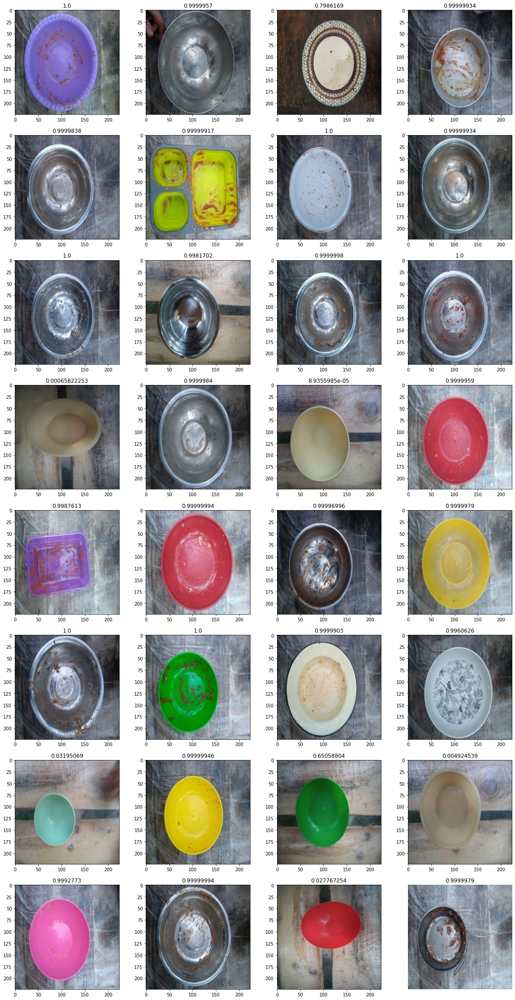

In [ ]:
inputs, labels, _ = next(iter(test_dataloader))
plot_grid(inputs, test_predictions[:len(labels)], cols=4)

## Submit predictions to kaggle

In [ ]:
submission_df = pd.DataFrame.from_dict({'id': test_img_paths, 'label': test_predictions})

In [ ]:
dir_path, _ = os.path.split(test_dataset.labeled_images[0][0])
submission_df['label'] = submission_df['label'].map(lambda pred: 'dirty' if pred > 0.5 else 'cleaned')
submission_df['id'] = submission_df['id'].str.replace(dir_path + '/', '')
submission_df['id'] = submission_df['id'].str.replace('.jpg', '')
submission_df.set_index('id', inplace=True)
submission_df.head(n=6)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: The default value of regex will change from True to False in a future version.
  after removing the cwd from sys.path.


,label
id,
0000,dirty
0001,dirty
0002,dirty
0003,dirty
0004,dirty
0005,dirty


In [ ]:
submission_df.to_csv('submission.csv')

In [ ]:
!kaggle competitions submit -c platesv2 -f submission.csv -m "Refactor - try 3"

100% 8.29k/8.29k [00:01<00:00, 4.26kB/s]
Successfully submitted to Cleaned vs Dirty V2

## Clear data

In [ ]:
!rm -rf train val test